In [1]:
import os
import numpy as np
import pandas as pd
import cv2 as cv
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
from PIL import Image

In [2]:
def fix_layout(width:int=95):
    from IPython.core.display import display, HTML
    display(HTML('<style>.container { width:' + str(width) + '% !important; }</style>'))

fix_layout()

In [3]:
# reminder: image is downscaled by 3, we need to downscale the label coordinates as well
scale = 3

### Select Dataset

In [4]:
DATASET_NUMBER = 3

In [5]:
# location of silicon wafer 1 data
dir_silicon_wafer = "../dataset/section-segmentation-dataset/silicon_wafer_"+str(DATASET_NUMBER)

In [6]:
index = pd.MultiIndex.from_tuples([('point_1', 'x'), ('point_1', 'y'), ('point_2', 'x'), ('point_2', 'y'),
                                   ('point_3', 'x'), ('point_3', 'y'), ('point_4', 'x'), ('point_4', 'y')])

### Drawing

In [7]:
def rgb(hex_color):
    return tuple(int(hex_color.lstrip('#')[i:i+2], 16) for i in (0, 2 ,4))

In [8]:
def draw_labels(image, labels_df, thickness, color, fill_poly):
    for row in range(labels_df.shape[0]):
        pts = np.array(labels_df.loc[row]).reshape((-1,1,2))
        if fill_poly:
            image = cv.fillPoly(image, np.int32([pts]), color=rgb(color))
        else:
            image = cv.polylines(image, np.int32([pts]), True, color=rgb(color), thickness=thickness)
    
    return image

In [9]:
thickness = 5
magnet_color = "#00cccc"
tissue_color = "#ff6666"

fill_poly = False

In [10]:
legend_elements = [Line2D([0], [0], color=magnet_color, lw=thickness, label='Magnet Part'),
                       Line2D([0], [0], color=tissue_color, lw=thickness, label='Brain Part')]

### Load Segmentation Boxes (Mag + Tissues)

In [11]:
wafer_tissue_lbl = pd.read_csv(f"{dir_silicon_wafer}/source_sections_tissue.txt", sep="\t|,", header=None, names=index, engine='python')//3

In [12]:
wafer_mag_lbl = pd.read_csv(f"{dir_silicon_wafer}/source_sections_mag.txt", sep="\t|,", header=None, names=index, engine='python')//3

In [13]:
path_img= f"{dir_silicon_wafer}/wafer_"+str(DATASET_NUMBER)+"_downsized_3.tif"
if os.path.isfile(path_img):
    wafer_1 = cv.imread(path_img)
else:
    print ("The file " + path_img + " does not exist.")

### Compute Section Detection Boxes + Save Cropped Image

- Instead of getting the segmentation boxes for the brain part, then the mag part, this will create a box around the full section (including brain and mag part). 
- Compute and save txt file the coordinates of each Detection box (cropped)
- It will then save a new cropped image based on this detection box, to get only one section in the image.
- Create 2 new text files describing the segmentation boxes for each cropped image.


In [14]:
f_seg_tissues= open("boxes_tissues_"+str(DATASET_NUMBER)+".txt","w+")
f_seg_mag= open("boxes_mag_"+str(DATASET_NUMBER)+".txt","w+")
f_boxes= open("new_boxes_"+str(DATASET_NUMBER)+".txt","w+")

# Iterate through all section of the specified dataset image
for i in range(wafer_mag_lbl.shape[0]):
    
    # Can modify the margin (Ex for dataset 3 better to put margin = 100)
    margin = 50
    
    # Load segmentation mag
    temp_mag = wafer_mag_lbl.iloc[i]
    # Extract the x-y min/max border of the mag part.
    max_x_mag = max(temp_mag['point_1']['x'], temp_mag['point_2']['x'], temp_mag['point_3']['x'], temp_mag['point_4']['x'])
    min_x_mag = min(temp_mag['point_1']['x'], temp_mag['point_2']['x'], temp_mag['point_3']['x'], temp_mag['point_4']['x'])
    max_y_mag = max(temp_mag['point_1']['y'], temp_mag['point_2']['y'], temp_mag['point_3']['y'], temp_mag['point_4']['y'])
    min_y_mag = min(temp_mag['point_1']['y'], temp_mag['point_2']['y'], temp_mag['point_3']['y'], temp_mag['point_4']['y'])
    
    # Load segmentation tissue
    temp_tissue = wafer_tissue_lbl.iloc[i]
    # Extract the x-y min/max border of the tissue part and compare it to the mag x-y min/max part.
    # It will then get the limit coordinates of the full section (tissue + mag)
    # We add a margin at the coordinates to not crop exactly the section, and get some "noise/closed section part"
    max_x = max(max_x_mag,temp_tissue['point_1']['x'], temp_tissue['point_2']['x'], temp_tissue['point_3']['x'], temp_tissue['point_4']['x']) + margin//3 
    min_x = min(min_x_mag,temp_tissue['point_1']['x'], temp_tissue['point_2']['x'], temp_tissue['point_3']['x'], temp_tissue['point_4']['x']) - margin//3 
    max_y = max(max_y_mag,temp_tissue['point_1']['y'], temp_tissue['point_2']['y'], temp_tissue['point_3']['y'], temp_tissue['point_4']['y']) + margin//3 
    min_y = min(min_y_mag,temp_tissue['point_1']['y'], temp_tissue['point_2']['y'], temp_tissue['point_3']['y'], temp_tissue['point_4']['y']) - margin//3
    
    # Compute the coordinates of the tissue segmentation boxes in the Croppped image (Size of image changed, starting coordinates too)
    crop_tissues_p1_x = temp_tissue['point_1']['x'] - min_x  
    crop_tissues_p1_y = temp_tissue['point_1']['y'] - min_y  
    
    crop_tissues_p2_x = temp_tissue['point_2']['x'] - min_x  
    crop_tissues_p2_y = temp_tissue['point_2']['y'] - min_y  
    
    crop_tissues_p3_x = temp_tissue['point_3']['x'] - min_x  
    crop_tissues_p3_y = temp_tissue['point_3']['y'] - min_y 
    
    crop_tissues_p4_x = temp_tissue['point_4']['x'] - min_x 
    crop_tissues_p4_y = temp_tissue['point_4']['y'] - min_y 
    
    # Compute the coordinates of the mag segmentation boxes in the Croppped image (Size of image changed, starting coordinates too)
    crop_mag_p1_x = temp_mag['point_1']['x'] - min_x  
    crop_mag_p1_y = temp_mag['point_1']['y'] - min_y  
    
    crop_mag_p2_x = temp_mag['point_2']['x'] - min_x  
    crop_mag_p2_y = temp_mag['point_2']['y'] - min_y  
    
    crop_mag_p3_x = temp_mag['point_3']['x'] - min_x  
    crop_mag_p3_y = temp_mag['point_3']['y'] - min_y 
    
    crop_mag_p4_x = temp_mag['point_4']['x'] - min_x 
    crop_mag_p4_y = temp_mag['point_4']['y'] - min_y 
    
    #Store in files
    f_seg_tissues.write("%d,%d\t%d,%d\t%d,%d\t%d,%d\r\n" % (crop_tissues_p1_x,crop_tissues_p1_y,  crop_tissues_p2_x,crop_tissues_p2_y,  crop_tissues_p3_x,crop_tissues_p3_y,  crop_tissues_p4_x,crop_tissues_p4_y))
    f_seg_mag.write("%d,%d\t%d,%d\t%d,%d\t%d,%d\r\n" % (crop_mag_p1_x,crop_mag_p1_y,  crop_mag_p2_x,crop_mag_p2_y,  crop_mag_p3_x,crop_mag_p3_y,  crop_mag_p4_x,crop_mag_p4_y))
    f_boxes.write("%d,%d\t%d,%d\t%d,%d\t%d,%d\r\n" % (min_x, min_y,  max_x,min_y,  max_x,max_y,  min_x,max_y))
    
    # Save new cropped image in file .tiff
    crop_img = wafer_1[min_y:max_y, min_x:max_x]
    cv.imwrite("data"+str(DATASET_NUMBER)+"_cropped/"+str(i)+".tiff", crop_img)
    
f_seg_tissues.close()
f_seg_mag.close()
f_boxes.close()

### Plot the Detection Cropped Boxes

In [15]:
box_ = pd.read_csv(f"new_boxes_"+str(DATASET_NUMBER)+".txt", sep="\t|,", header=None, names=index, engine='python')
#Without scale
box_.head()

point_1       point_2       point_3       point_4      
        x     y       x     y       x     y       x     y
0    4871  2259    5266  2259    5266  2596    4871  2596
1    2994  5514    3368  5514    3368  5833    2994  5833
2    2710  5399    3038  5399    3038  5786    2710  5786
3    2539  5128    2929  5128    2929  5454    2539  5454
4    2941  5218    3341  5218    3341  5562    2941  5562

In [16]:
path_img= f"{dir_silicon_wafer}/wafer_"+str(DATASET_NUMBER)+"_downsized_3.tif"
if os.path.isfile(path_img):
    wafer_1 = cv.imread(path_img)
else:
    print ("The file " + path_img + " does not exist.")

In [17]:
wafer_1 = draw_labels(wafer_1, box_, thickness, magnet_color, fill_poly)

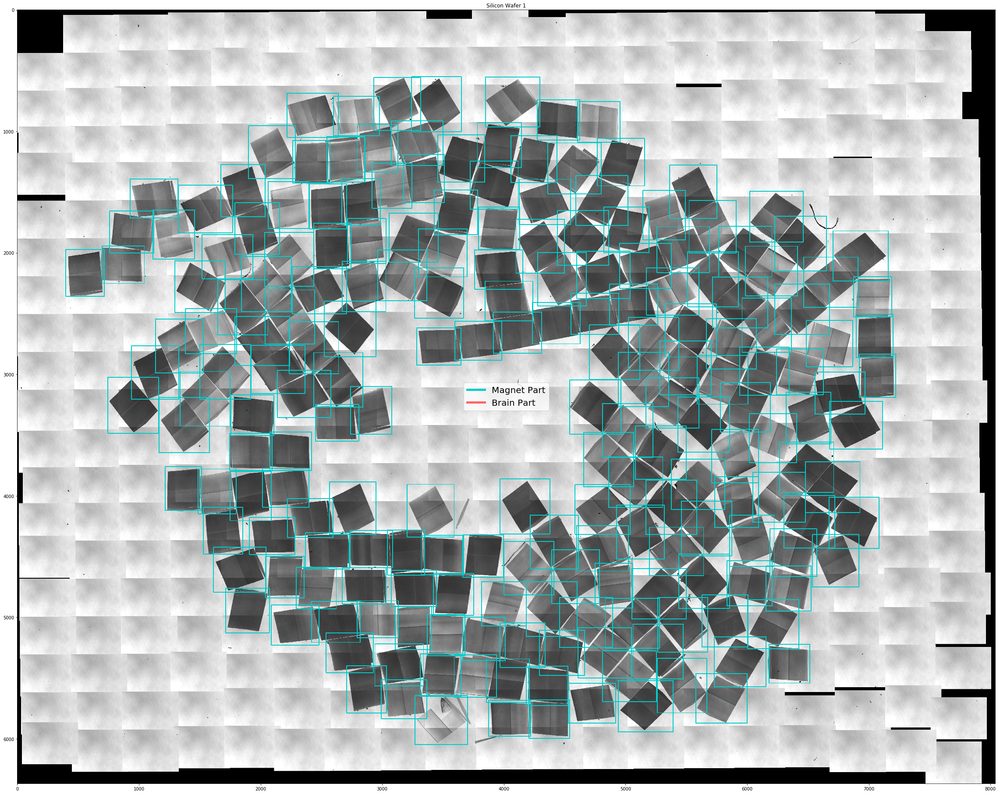

In [18]:
plt.figure(figsize=(40, 36.61))
plt.imshow(wafer_1)

plt.title('Silicon Wafer 1')

plt.legend(handles=legend_elements, loc='center', fontsize=20)

plt.show()

### Plot the Segmentation boxes in cropped images

In [19]:
boxes_tissues = pd.read_csv(f"boxes_tissues_"+str(DATASET_NUMBER)+".txt", sep="\t|,", header=None, names=index, engine='python')
#Without scale
boxes_tissues.head()

point_1      point_2      point_3      point_4     
        x    y       x    y       x    y       x    y
0     166   35     314   16     379  265     230  294
1     166   25     312   16     358  271     210  288
2     297  168     312  313      59  371      35  217
3     220  296      72  310      16   56     169   34
4     234  304      91  328      16   79     164   47

In [20]:
boxes_mag = pd.read_csv(f"boxes_mag_"+str(DATASET_NUMBER)+".txt", sep="\t|,", header=None, names=index, engine='python')
#Without scale
boxes_mag.head()

point_1      point_2      point_3      point_4     
        x    y       x    y       x    y       x    y
0      16   59     155   38     216  297      74  321
1      16   38     155   26     196  290      56  303
2     276   16     295  157      33  208      16   68
3     374  277     231  294     182   32     325   16
4     384  277     245  302     178   43     315   16

In [21]:
# Draw only one box
def draw_labels_custom(image, labels_df, thickness, color, fill_poly):
    pts = np.array(labels_df).reshape((-1,1,2))
    if fill_poly:
        image = cv.fillPoly(image, np.int32([pts]), color=rgb(color))
    else:
        image = cv.polylines(image, np.int32([pts]), True, color=rgb(color), thickness=thickness)

    return image

##### Load cropped image

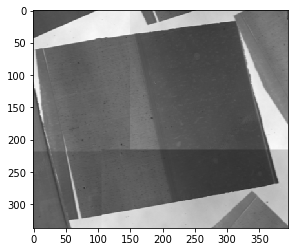

In [29]:
index_cropped_image = 0

path_cropped = "data"+str(DATASET_NUMBER)+"_cropped/"+str(index_cropped_image)+".tiff"
if os.path.isfile(path_img):
    cropped = cv.imread(path_cropped)
else:
    print ("The file " + path_cropped + " does not exist.")

plt.imshow(cropped)

##### Cleaned/Extracted cropped image

This part is using an extracted image. Based on the produced cropped image, we extract only the interesting section (using GUI with polygon, infographic tools like Gimp, Photoshop etc..) __Manual Part__


And we plot the segmentation boxes which are the same as the initial cropped image, as the size didn't changed.

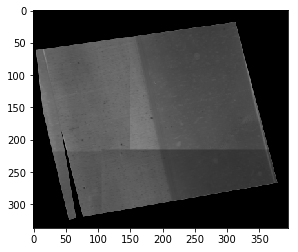

In [30]:
path_cropped = "data"+str(DATASET_NUMBER)+"_cropped/extract/"+str(index_cropped_image)+".tiff"
if os.path.isfile(path_img):
    extract_cropped = cv.imread(path_cropped)
else:
    print ("The file " + path_cropped + " does not exist.")

plt.imshow(extract_cropped)

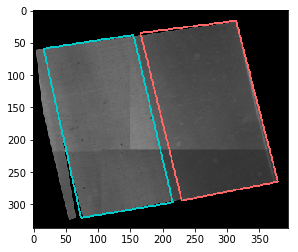

In [31]:
seg_tissue = boxes_tissues[index_cropped_image:index_cropped_image+1]
seg_mag = boxes_mag[index_cropped_image:index_cropped_image+1]

extract_cropped = draw_labels_custom(extract_cropped, seg_tissue, 2, tissue_color, fill_poly)
extract_cropped = draw_labels_custom(extract_cropped, seg_mag, 2, magnet_color, fill_poly)

plt.imshow(extract_cropped)

### Check that all segmentation boxes are well associated with all the cropped images 
(from a chosen dataset)

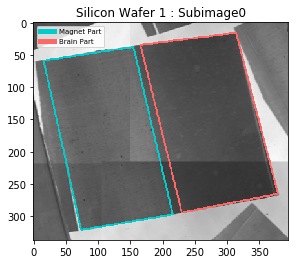

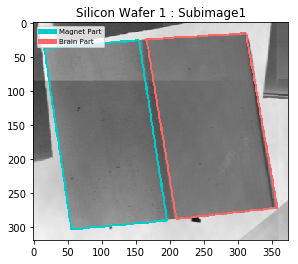

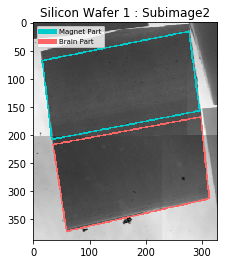

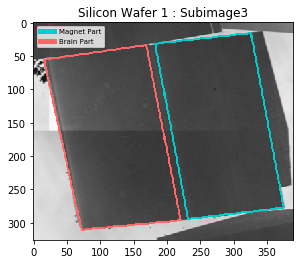

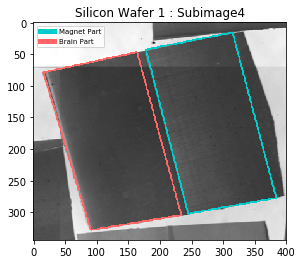

...

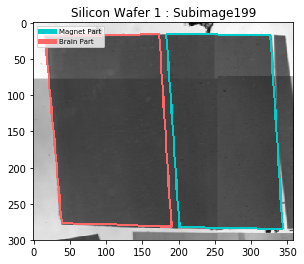

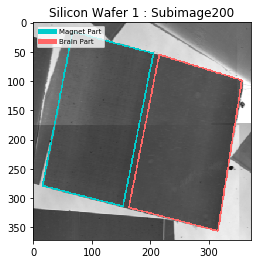

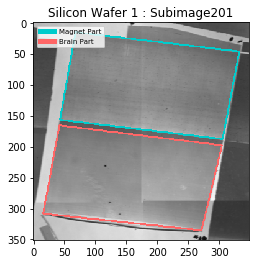

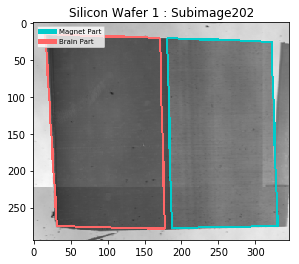

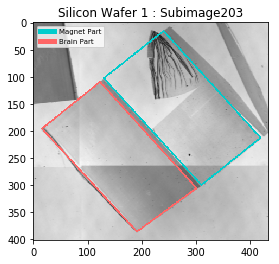

In [25]:
for i in range(boxes_mag.shape[0]):
    path_cropped = "data"+str(DATASET_NUMBER)+"_cropped/"+str(i)+".tiff"
    if os.path.isfile(path_img):
        cropped = cv.imread(path_cropped)
    else:
        print ("The file " + path_cropped + " does not exist.")
    
    seg_tissue = boxes_tissues[i:i+1]
    seg_mag = boxes_mag[i:i+1]
    
    cropped = draw_labels_custom(cropped, seg_tissue, 2, tissue_color, fill_poly)
    cropped = draw_labels_custom(cropped, seg_mag, 2, magnet_color, fill_poly)

    plt.imshow(cropped)
    plt.title("Silicon Wafer 1 : Subimage"+str(i))
    legend_elements = [Line2D([0], [0], color=magnet_color, lw=thickness, label='Magnet Part'),
                       Line2D([0], [0], color=tissue_color, lw=thickness, label='Brain Part')]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=7)

    plt.show()   
    cv.waitKey(1)
